In [ ]:
!pip install opencv-contrib-python==3.4.13.47 --force-reinstall

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 53.7 MB 154 kB/s 
     |████████████████████████████████| 15.7 MB 36.6 MB/s 
  Attempting uninstall: numpy
    Found existing installation: numpy 1.21.6
    Uninstalling numpy-1.21.6:
      Successfully uninstalled numpy-1.21.6
  Attempting uninstall: opencv-contrib-python
    Found existing installation: opencv-contrib-python 4.1.2.30
    Uninstalling opencv-contrib-python-4.1.2.30:
      Successfully uninstalled opencv-contrib-python-4.1.2.30
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.8.0+zzzcolab20220506162203 requires tf-estimator-nightly==2.8.0.dev2021122109, which is not installed.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.
albumentations 0.1.12 require

In [ ]:
!pip install imutils

In [ ]:
import os
from google.colab import drive
drive.mount('/content/drive')

!cp -R '/content/drive/MyDrive/Colab Notebooks/yolov4.zip' '/content'

!unzip 'yolov4.zip'

Mounted at /content/drive
Archive:  yolov4.zip
   creating: yolov4/
  inflating: yolov4/coco.names       
  inflating: yolov4/yolov4.cfg       
  inflating: __MACOSX/yolov4/._yolov4.cfg  
  inflating: yolov4/yolov4.weights   
  inflating: __MACOSX/yolov4/._yolov4.weights  


In [ ]:
!pip list

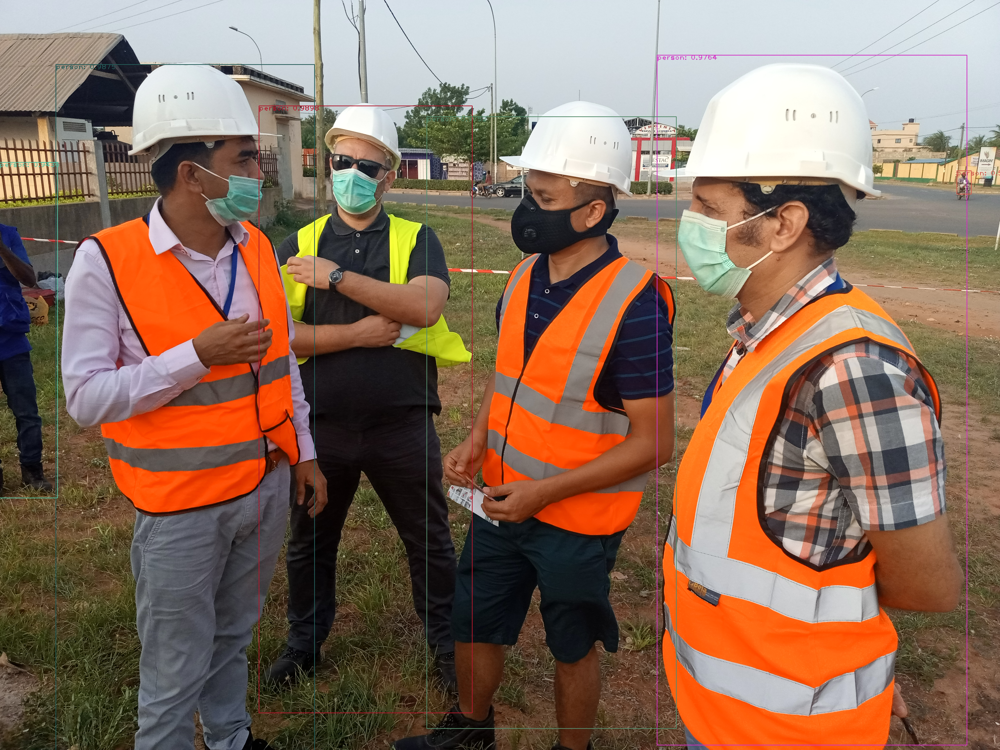

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
import matplotlib as mpl

# load our YOLO object detector trained on COCO dataset (80 classes)
net = cv2.dnn.readNetFromDarknet('yolov4/yolov4.cfg', 'yolov4/yolov4.weights')
ln = net.getLayerNames()
#ln = [ln[i[0] - 1] for i in net.getUnconnectedOutLayers()]
#ln = [ln[i - 1] for i in net.getUnconnectedOutLayers()]
ln = [ln[i[0] - 1] for i in net.getUnconnectedOutLayers()]

DEFAULT_CONFIANCE = 0.5
THRESHOLD = 0.4
# load the COCO class labels our YOLO model was trained on
with open('yolov4/coco.names', 'r') as f:
    LABELS = f.read().splitlines()

# initialize the video stream, pointer to output video file
#cap = cv2.VideoCapture(0)

#image = cv2.imread('family-and-dog.jpeg')
#image = cv2.imread('IMG_20200425_171339_411.jpg')
image = cv2.imread('IMG-20210423-WA0024.jpg')

height, width, _ = image.shape

blob = cv2.dnn.blobFromImage(image, 1/255, (416, 416), (0,0,0), swapRB=True, crop=False)
net.setInput(blob)
layerOutputs = net.forward(ln)

# initialize our lists of detected bounding boxes, confidences, and class IDs, respectively
boxes = []
confidences = []
classIDs = []

# loop over each of the layer outputs
for output in layerOutputs:
    # loop over each of the detections
    for detection in output:
        # extract the class ID and confidence (i.e., probability)
        # of the current object detection
        scores = detection[5:]
        classID = np.argmax(scores)
        confidence = scores[classID]
        # filter out weak predictions by ensuring the detected
        # probability is greater than the minimum probability
        if confidence > DEFAULT_CONFIANCE:
            # scale the bounding box coordinates back relative to
            # the size of the image, keeping in mind that YOLO
            # actually returns the center (x, y)-coordinates of
            # the bounding box followed by the boxes' width and
            # height
            box = detection[0:4] * np.array([width, height, width, height])
            (centerX, centerY, W, H) = box.astype("int")
            # use the center (x, y)-coordinates to derive the top
            # and and left corner of the bounding box
            x = int(centerX - (W / 2))
            y = int(centerY - (H / 2))
            # update our list of bounding box coordinates,
            # confidences, and class IDs
            boxes.append([x, y, int(W), int(H)])
            confidences.append(float(confidence))
            classIDs.append(classID)
    
# apply non-maxima suppression to suppress weak, overlapping
# bounding boxes
indexes = cv2.dnn.NMSBoxes(boxes, confidences, DEFAULT_CONFIANCE, THRESHOLD)

# initialize a list of colors to represent each possible class label
COLORS = np.random.uniform(0,255,size=(len(boxes), 3))

# ensure at least one detection exists
if len(indexes) > 0:
    # loop over the indexes we are keeping
    for i in indexes.flatten():
        # extract the bounding box coordinates
        (x, y, w, h) = boxes[i]
        # draw a bounding box rectangle and label on the frame
        color = COLORS[i]
        text = "{}: {:.4f}".format(LABELS[classIDs[i]], confidences[i])
        cv2.rectangle(image, (x, y), (x + w, y + h), color, 2)
        cv2.putText(image, text, (x, y + 20 ), cv2.FONT_HERSHEY_PLAIN, 2, color, 2)
        

cv2_imshow(image)

#cv2.destroyAllWindows()

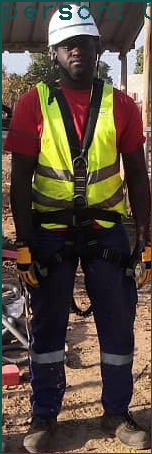

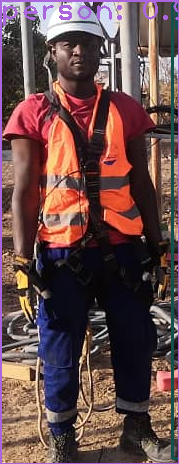

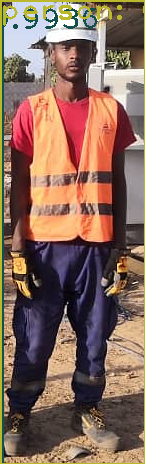

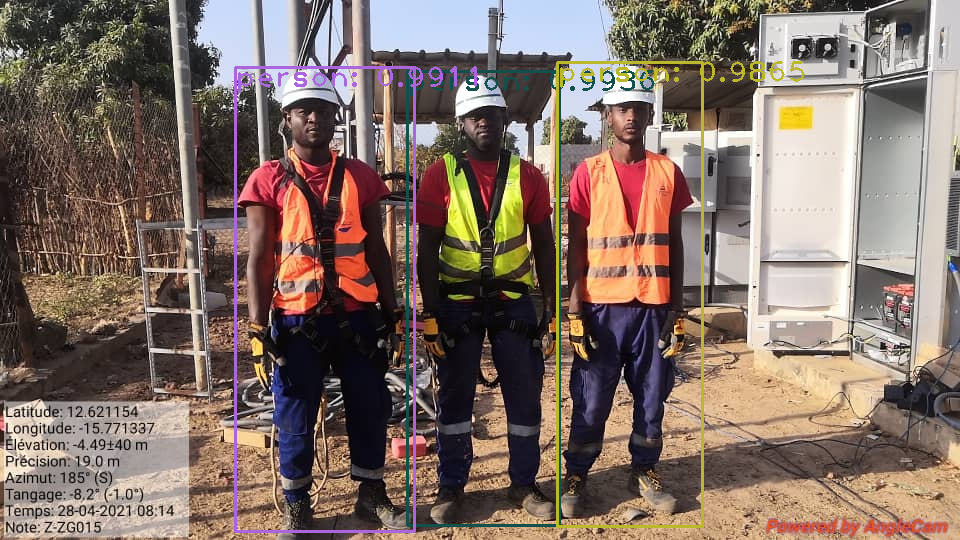

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
import matplotlib as mpl

# load our YOLO object detector trained on COCO dataset (80 classes)
net = cv2.dnn.readNetFromDarknet('yolov4/yolov4.cfg', 'yolov4/yolov4.weights')
ln = net.getLayerNames()
#ln = [ln[i[0] - 1] for i in net.getUnconnectedOutLayers()]
ln = [ln[i[0] - 1] for i in net.getUnconnectedOutLayers()]

DEFAULT_CONFIANCE = 0.5
THRESHOLD = 0.4
# load the COCO class labels our YOLO model was trained on
with open('yolov4/coco.names', 'r') as f:
    LABELS = f.read().splitlines()

# initialize the video stream, pointer to output video file
#cap = cv2.VideoCapture(0)

#image = cv2.imread('family-and-dog.jpeg')
image = cv2.imread('IMG-20210428-WA0001.jpg')

height, width, _ = image.shape

blob = cv2.dnn.blobFromImage(image, 1/255, (416, 416), (0,0,0), swapRB=True, crop=False)
net.setInput(blob)
layerOutputs = net.forward(ln)

# initialize our lists of detected bounding boxes, confidences, and class IDs, respectively
boxes = []
confidences = []
classIDs = []

# loop over each of the layer outputs
for output in layerOutputs:
    # loop over each of the detections
    for detection in output:
        # extract the class ID and confidence (i.e., probability)
        # of the current object detection
        scores = detection[5:]
        classID = np.argmax(scores)
        confidence = scores[classID]
        # filter out weak predictions by ensuring the detected
        # probability is greater than the minimum probability
        if confidence > DEFAULT_CONFIANCE:
            # scale the bounding box coordinates back relative to
            # the size of the image, keeping in mind that YOLO
            # actually returns the center (x, y)-coordinates of
            # the bounding box followed by the boxes' width and
            # height
            box = detection[0:4] * np.array([width, height, width, height])
            (centerX, centerY, W, H) = box.astype("int")
            # use the center (x, y)-coordinates to derive the top
            # and and left corner of the bounding box
            x = int(centerX - (W / 2))
            y = int(centerY - (H / 2))
            # update our list of bounding box coordinates,
            # confidences, and class IDs
            boxes.append([x, y, int(W), int(H)])
            confidences.append(float(confidence))
            classIDs.append(classID)
    
# apply non-maxima suppression to suppress weak, overlapping
# bounding boxes
indexes = cv2.dnn.NMSBoxes(boxes, confidences, DEFAULT_CONFIANCE, THRESHOLD)

# initialize a list of colors to represent each possible class label
COLORS = np.random.uniform(0,255,size=(len(boxes), 3))

# ensure at least one detection exists
if len(indexes) > 0:
    # loop over the indexes we are keeping
    i=0
    for i in indexes.flatten():
        # extract the bounding box coordinates
        (x, y, w, h) = boxes[i]
        # draw a bounding box rectangle and label on the frame
        color = COLORS[i]
        text = "{}: {:.4f}".format(LABELS[classIDs[i]], confidences[i])
        cv2.rectangle(image, (x, y), (x + w, y + h), color, 2)
        cv2.putText(image, text, (x, y + 20 ), cv2.FONT_HERSHEY_PLAIN, 2, color, 2)

        if(LABELS[classIDs[i]] == "person") : 
          cropped_image = image[y:y+h, x:x+w]
          #print([x,y,w,h])
          #plt.imshow(cropped_image)
          cv2_imshow(cropped_image)
          cv2.imwrite('person'+str(i)+'.png', cropped_image)
        

cv2_imshow(image)

#cv2.destroyAllWindows()

In [ ]:
!cp -R '/content/drive/MyDrive/Colab Notebooks/drive-pictor-ppe/extras' '/content'

!cp '/content/drive/MyDrive/Colab Notebooks/ppe.zip' '/content'

!unzip 'ppe.zip'

In [ ]:
import os
directory = 'Helmet pictures/'
 
# iterate over files in
# that directory
for filename in os.listdir(directory):
    f = os.path.join(directory, filename)
    # checking if it is a file
    if os.path.isfile(f):

        image = cv2.imread(f)

        height, width, _ = image.shape

        blob = cv2.dnn.blobFromImage(image, 1/255, (416, 416), (0,0,0), swapRB=True, crop=False)
        net.setInput(blob)
        layerOutputs = net.forward(ln)

        # initialize our lists of detected bounding boxes, confidences, and class IDs, respectively
        boxes = []
        confidences = []
        classIDs = []

        # loop over each of the layer outputs
        for output in layerOutputs:
            # loop over each of the detections
            for detection in output:
                # extract the class ID and confidence (i.e., probability)
                # of the current object detection
                scores = detection[5:]
                classID = np.argmax(scores)
                confidence = scores[classID]
                # filter out weak predictions by ensuring the detected
                # probability is greater than the minimum probability
                if confidence > DEFAULT_CONFIANCE:
                    # scale the bounding box coordinates back relative to
                    # the size of the image, keeping in mind that YOLO
                    # actually returns the center (x, y)-coordinates of
                    # the bounding box followed by the boxes' width and
                    # height
                    box = detection[0:4] * np.array([width, height, width, height])
                    (centerX, centerY, W, H) = box.astype("int")
                    # use the center (x, y)-coordinates to derive the top
                    # and and left corner of the bounding box
                    x = int(centerX - (W / 2))
                    y = int(centerY - (H / 2))
                    # update our list of bounding box coordinates,
                    # confidences, and class IDs
                    boxes.append([x, y, int(W), int(H)])
                    confidences.append(float(confidence))
                    classIDs.append(classID)
            
        # apply non-maxima suppression to suppress weak, overlapping
        # bounding boxes
        indexes = cv2.dnn.NMSBoxes(boxes, confidences, DEFAULT_CONFIANCE, THRESHOLD)

        # initialize a list of colors to represent each possible class label
        COLORS = np.random.uniform(0,255,size=(len(boxes), 3))

        # ensure at least one detection exists
        if len(indexes) > 0:
            # loop over the indexes we are keeping
            for i in indexes.flatten():
                # extract the bounding box coordinates
                (x, y, w, h) = boxes[i]
                # draw a bounding box rectangle and label on the frame
                color = COLORS[i]
                text = "{}: {:.4f}".format(LABELS[classIDs[i]], confidences[i])
                cv2.rectangle(image, (x, y), (x + w, y + h), color, 2)
                cv2.putText(image, text, (x, y + 20 ), cv2.FONT_HERSHEY_PLAIN, 2, color, 2)

        cv2_imshow(image)
